# 6 months prediction using Selected Features
#### Name: Xiaoyu Wu 
#### Student ID : 1218098

---

#### This file contains:

* Prediction for 2019.07-2019.12 (second half of 2019) using data from 2008-2019.06

In [1]:
import pandas as pd
import numpy as np
import csv
import seaborn as sns
from time import strptime

import matplotlib.pyplot as plt

import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from xgboost import plot_importance, plot_tree
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from BorutaShap import BorutaShap
import missingno as msno

#!pip install shap
import shap
shap.initjs()

## Load data

In [2]:
# load data


# loaded data with index and has "month" column
combined_data1 = pd.read_csv("./data/old_08-19_combined.csv")
# loaded data without index and has no "month" column
combined_data = pd.read_csv("./data/old_08-19_combined.csv", index_col = [0])

combined_data.index = pd.to_datetime(combined_data.index)
combined_data1["month"] = pd.to_datetime(combined_data1["month"])

print(combined_data.shape)
print(combined_data1.shape)

#Check number of rows and columns, type of each columns
#combined_data.info()
#combined_data1.info()

(144, 79)
(144, 80)


<AxesSubplot:>

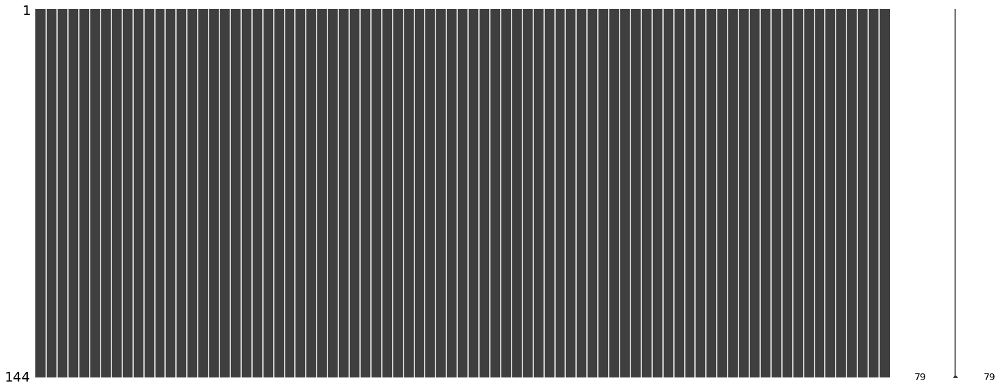

In [3]:
msno.matrix(combined_data)

## Checking time series properties of target variable y


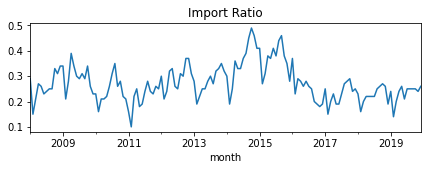

In [4]:
# plot the import ratio trend
_ = combined_data['import_ratio'].plot(figsize=(7, 2),title='Import Ratio')

#color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
#_ = only_y.plot(style='.', figsize=(15,5), color=color_pal[0], title='Import Ratio')



In [5]:
# check if stationary
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(combined_data.import_ratio.dropna())
print('p-value: %f' % result[1])

# 0.164061
#Since the p-value is over 0.05, the data is not stationary

p-value: 0.164061


## Change column type

In [6]:
# steer and us_import got object type, so we need to convert it to float which is a type we need for later
combined_data["us_livestock_commercial_steers"] = pd.to_numeric(combined_data.us_livestock_commercial_steers, errors='coerce')
#combined_data["us_livestock_commercial_steers"]
combined_data["total_us_imports"] = pd.to_numeric(combined_data.total_us_imports, errors='coerce')
#combined_data["total_us_imports"]

combined_data1["us_livestock_commercial_steers"] = pd.to_numeric(combined_data1.us_livestock_commercial_steers, errors='coerce')
#combined_data["us_livestock_commercial_steers"]
combined_data1["total_us_imports"] = pd.to_numeric(combined_data1.total_us_imports, errors='coerce')
#combined_data["total_us_imports"]

# get the col type
a = combined_data.columns.to_series().groupby(combined_data.dtypes).groups
#print(a)
b = combined_data1.columns.to_series().groupby(combined_data1.dtypes).groups
#b


# check a specific col type
#c = combined_data.iloc[:,45:48]
#c.dtypes



## Feature Engineering

refers to the process of creating new variables from existing ones which capture hidden business insights

### Lag features 
- are values at prior time steps
- the features have a lagged impact on the target variable
- The best way to find the optimal number of lags to chose for each field is to look at cross correlation graphs.
- Cross correlation graphs show the correlation between the target variable with various lags of raw features

In [8]:
# Check Optimal Number of Lags
#for i in range(len(no_month_df.columns)-3):
#    plt.figure(i, figsize=(15,2)) # add this statement before your plot
#    plt.xcorr(no_month_df.iloc[:,78],no_month_df.iloc[:,i],maxlags=45, usevlines=1)
#    plt.title(no_month_df.columns[78] + ' & '+ no_month_df.columns[i])
#    plt.show()

In [9]:
def lag_feature(df, lags, new_df_col, target_col):
    tmp = df[new_df_col]
    for i in lags:
        tmp[target_col+'_lag_'+str(i)] = df[target_col].shift(i)
    
    tmp[target_col] = df[target_col]
    return tmp

def fill_na(df):
    for col in df.columns:
        if ('_lag_' in col) & (df[col].isnull().any()):
            df[col].fillna(0, inplace=True)         
    return df

## Now we have the data ready for modeling


## Train/Test Split
### Cut off the data after 2019.6 to use as our test set.



In [13]:
### All features
## Has outlier
# no month: combine_data
test_df = combined_data.iloc[138:144,:]
train_df = combined_data.iloc[:138,:]
X_train, y_train = train_df.iloc[:,:76], train_df.iloc[:,78]
X_test, y_test = test_df.iloc[:,:76], test_df.iloc[:,78]

# Scale the features
#X_train = StandardScaler().fit_transform(X_train)
#X_test = StandardScaler().fit_transform(X_test)

# has month: combine_data1
test_df1 = combined_data1.iloc[138:144,:]
train_df1 = combined_data1.iloc[:138,:]
X_train1, y_train1 = train_df1.iloc[:,:77], train_df1.iloc[:,79]
X_test1, y_test1 = test_df1.iloc[:,:77], test_df1.iloc[:,79]

X_test

,aus_population_natural_increase,aus_population_overseas_arrivals,aus_population_net overseas migration,aus_population_estimated resident population,aus_beef&veal_slaughterings,aus_beef&veal_average weight,aus_beef&veal_production,aus_beef&veal_exports,aus_apparent consumption,australia cattle numbers,...,us_fed_avg_dressed_steers,us_fed_avg_dressed_heifers,us_fed_avg_dressed_cows,us_fed_avg_dressed_bulls and stags,us_fed_avg_dressed_calves,us_cold_storage_beef,us_cold_storage_veal,us_veganism,us_beef,us_veganism_trend_ratio
month,,,,,,,,,,,,,,,,,,,,,
2019-07-01,10.8,54.2,24.8,25365.7,724.9,22.8,197.7,155.1,42.5,24723,...,866,796,643,883,117,405.65,4.26,74,53,0.58
2019-08-01,10.8,54.2,24.8,25401.3,724.9,22.8,197.7,155.1,42.5,24723,...,881,809,633,884,117,454.46,4.72,80,56,0.59
2019-09-01,10.8,54.2,24.8,25436.8,724.9,22.8,197.7,155.1,42.5,24723,...,894,822,636,878,123,469.88,5.39,75,57,0.57
2019-10-01,11.4,50.7,14.3,25472.4,724.9,22.8,197.7,155.1,42.5,24723,...,902,830,628,855,127,468.98,5.73,80,64,0.56
2019-11-01,11.4,50.7,14.3,25498.1,724.9,22.8,197.7,155.1,42.5,24723,...,911,840,627,859,130,466.27,5.66,100,63,0.61
2019-12-01,11.4,50.7,14.3,25523.9,724.9,22.8,197.7,155.1,42.5,24723,...,905,836,629,851,131,478.26,5.46,96,69,0.58


We tune a set of 8 parameters for this model: 
- number of gradient boosted trees, 
- maximum tree depth for base learners, 
- boosting learning rate, 
- minimum loss reduction required to make a further partition on a leaf node 
- minimum sum of weights of all observations required in a child node
- subsample
- colsample_bytree

In [14]:
xgb_Test_Accuracy_Data = pd.DataFrame(columns = ['outlier','n_estimators','max_depth','min_child_weight',
                                                 'gamma','learning_rate','subsample','colsample_bytree',
                                                 'eta','Train Accurcay','Test Accurcay', 'RMSE','MAE'])

### Modeling for data contains outlier
- all features

- all + lag features

- only selected

In [15]:
100%|██████████| 2000/2000 [17:32<00:00,  1.90trial/s, best loss: 0.0026049262209158573]
The best hyperparameters are :  

{'colsample_bytree': 0.9168211311864924, 'learning_rate': 0.5568603386960681,
 'max_depth': 10.0, 'min_child_weight': 7.0, 'n_estimators': 854.0, 'subsample': 0.4288820971528955}

SyntaxError: invalid syntax (<ipython-input-15-8cb4fd30b666>, line 1)

In [15]:
outlier = 'all_yes'

## Parameter Setting

# Number of trees
n_estimators = 854

# Maximum number of levels in tree
max_depth = 10

#minimum sum of weights of all observations required in a child
min_child_weight = 7

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.5568603386960681
subsample = 0.4288820971528955 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.9168211311864924  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed)

#Fit the regressor to the training set
#model_all_yes= xgb_reg.fit(X_train, y_train)

evaluation = [(X_train, y_train), (X_test, y_test)]
model_all_yes = xgb_reg.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(X_train)

# Calculate the absolute errors
errors_train = abs(predictions_train - y_train)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ y_train)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(X_test)

# Calculate the absolute errors
errors_test = abs(predictions_test - y_test)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ y_test)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(X_test)

test_df['predictions'] = predictions
test_df1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(y_test, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(y_test, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)

print(round(np.mean(mape_test),6))
xgb_Test_Accuracy_Data

0.682381


,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.55686,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719


In [ ]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(X_train, y_train)
    #predictions = xgb_reg.predict(selected_X_test)

    evaluation = [(X_train, y_train), (X_test, y_test)]
    
    xgb_reg.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mae = mean_absolute_error(y_test, predictions)
    #mse= mean_squared_error(y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 2000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

### Feature Selection
- based on feature score from xgboost
- based on shap value

In [16]:
X_train.shape 
xgb_Test_Accuracy_Data
# there are 76 features in total

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.55686,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719


## Featuer Selection Using XGBoost Feature Importance

In [129]:
### Based on Feature score from XGBoost (Gain)
from numpy import sort
from sklearn.feature_selection import SelectFromModel


thresholds = sort(model_all_yes.feature_importances_)
for thresh in thresholds:
    # select features using threshold
    selection = SelectFromModel(model_all_yes, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)
    select_X_test = selection.transform(X_test)
    
    # train model
    selection_model = xgb.XGBRegressor()
    #selection_model = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
    #                               max_depth = max_depth, min_child_weight = min_child_weight,
    #                               gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
    #                               eta = eta, seed = seed)
    
    #selection_model.fit(select_X_train, y_train)
    
    evaluation = [(select_X_train, y_train), (select_X_test, y_test)]
    
    selection_model.fit(select_X_train, y_train,
                        eval_set=evaluation, eval_metric="rmse",
                        early_stopping_rounds=10,verbose=False)
    
    # eval model
    #select_X_test = selection.transform(X_test)
    y_pred = selection_model.predict(select_X_test)
    predictions = [round(value) for value in y_pred]
    
    #accuracy = accuracy_score(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    
    errors_test = abs(y_pred - y_test)
    mape_test = 100 * (errors_test/ y_test)
    mape = np.mean(mape_test)
    
    #print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy*100.0))
    print("Thresh=%.8f, n=%d, RMSE: %.8f, MAE: %.8f, MAPE: %.8f" % (thresh, select_X_train.shape[1], rmse, mae, mape))

Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751
Thresh=0.00000000, n=76, RMSE: 0.01476794, MAE: 0.01195783, MAPE: 4.83107751

In [130]:
importances = list(zip(model_all_yes.feature_importances_, X_train.columns))
importances.sort(reverse=True)
pd.DataFrame(importances).to_csv('6m_xgboost_importance.csv')
importances


[(0.16674285, 'us cattle numbers(*1000)'),
 (0.13165617, 'us_commercial_avg_live_calves'),
 (0.09792064, 'us_production_commercial_total red meat'),
 (0.06354026, 'aus_exports of beef, veal and live cattle to US'),
 (0.04395735, 'us_production_fedral_inspected_total poultry'),
 (0.04296531, 'us_livestock_commercial_mature sheep'),
 (0.03754539, 'aus_beef&veal_exports'),
 (0.02521876, 'aus_population_overseas_arrivals'),
 (0.024759047, 'us_veganism'),
 (0.02421514, 'aus_avg_rainfall'),
 (0.022204917, 'aus_labour'),
 (0.020940788, 'us_livestock_commercial_heifers'),
 (0.020652408, 'us_cold_storage_beef'),
 (0.019176533, 'us_veganism_trend_ratio'),
 (0.018505411,
  'Value of Australian exports of beef and veal, and live cattle to US '),
 (0.017425513, 'aus_population_natural_increase'),
 (0.017039057, 'us_livestock_commercial_lambs and yearlings'),
 (0.015909579, 'aus_beef&veal_slaughterings'),
 (0.015208709, 'us_fed_avg_dressed_heifers'),
 (0.012887827,
  'aus_Meat Produced ;  CALVES ;  

In [131]:
x = model_all_yes.get_booster().get_score(importance_type = "gain")
sortedx = {k:v for k, v in sorted(x.items(), key=lambda item: item[1], reverse=True)}
np.array([k for k, v in sortedx.items()])

array(['us cattle numbers(*1000)', 'us_commercial_avg_live_calves',
       'us_production_commercial_total red meat',
       'aus_exports of beef, veal and live cattle to US',
       'us_production_fedral_inspected_total poultry',
       'us_livestock_commercial_mature sheep', 'aus_beef&veal_exports',
       'aus_population_overseas_arrivals', 'us_veganism',
       'aus_avg_rainfall', 'aus_labour',
       'us_livestock_commercial_heifers', 'us_cold_storage_beef',
       'us_veganism_trend_ratio',
       'Value of Australian exports of beef and veal, and live cattle to US ',
       'aus_population_natural_increase',
       'us_livestock_commercial_lambs and yearlings',
       'aus_beef&veal_slaughterings', 'us_fed_avg_dressed_heifers',
       'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted',
       'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
       'aus_Meat Produced ;  CALVES ;  Total (State) ;',
       'us_production_commercial_

### Refit Model with selected features 

In [16]:
# create subdf from original dataset

xgb_selected_features_1 = ['us cattle numbers(*1000)', 'import_ratio']


xgb_selected_features_1_month = ['month','us cattle numbers(*1000)', 'import_ratio']


xgb_selected_features_22 = ['us cattle numbers(*1000)', 'us_commercial_avg_live_calves',
       'us_production_commercial_total red meat',
       'aus_exports of beef, veal and live cattle to US',
       'us_production_fedral_inspected_total poultry',
       'us_livestock_commercial_mature sheep', 'aus_beef&veal_exports',
       'aus_population_overseas_arrivals', 'us_veganism',
       'aus_avg_rainfall', 'aus_labour',
       'us_livestock_commercial_heifers', 'us_cold_storage_beef',
       'us_veganism_trend_ratio',
       'Value of Australian exports of beef and veal, and live cattle to US ',
       'aus_population_natural_increase',
       'us_livestock_commercial_lambs and yearlings',
       'aus_beef&veal_slaughterings', 'us_fed_avg_dressed_heifers',
       'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted',
       'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
       'aus_Meat Produced ;  CALVES ;  Total (State) ;', 'import_ratio']


xgb_selected_features_22_month = ['month','us cattle numbers(*1000)', 'us_commercial_avg_live_calves',
       'us_production_commercial_total red meat',
       'aus_exports of beef, veal and live cattle to US',
       'us_production_fedral_inspected_total poultry',
       'us_livestock_commercial_mature sheep', 'aus_beef&veal_exports',
       'aus_population_overseas_arrivals', 'us_veganism',
       'aus_avg_rainfall', 'aus_labour',
       'us_livestock_commercial_heifers', 'us_cold_storage_beef',
       'us_veganism_trend_ratio',
       'Value of Australian exports of beef and veal, and live cattle to US ',
       'aus_population_natural_increase',
       'us_livestock_commercial_lambs and yearlings',
       'aus_beef&veal_slaughterings', 'us_fed_avg_dressed_heifers',
       'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted',
       'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
       'aus_Meat Produced ;  CALVES ;  Total (State) ;', 'import_ratio']



# select from original data
# no month: combine_data
xgb_selected_df = combined_data[xgb_selected_features_22]
idx = xgb_selected_df.shape[1]-1
xgb_selected_test_df = xgb_selected_df.iloc[138:144,:]
xgb_selected_train_df = xgb_selected_df.iloc[:138,:]

xgb_selected_X_train, xgb_selected_y_train = xgb_selected_train_df.iloc[:,:idx], xgb_selected_train_df.iloc[:,idx]
xgb_selected_X_test, xgb_selected_y_test = xgb_selected_test_df.iloc[:,:idx], xgb_selected_test_df.iloc[:,idx]



# has month: combine_data1
xgb_selected_df1 = combined_data1[xgb_selected_features_22_month]
idx1 = xgb_selected_df1.shape[1]-1
xgb_selected_test_df1 = xgb_selected_df1.iloc[138:144,:]
xgb_selected_train_df1 = xgb_selected_df1.iloc[:138,:]

xgb_selected_X_train1, xgb_selected_y_train1 = xgb_selected_train_df1.iloc[:,:idx1], xgb_selected_train_df1.iloc[:,idx1]
xgb_selected_X_test1, xgb_selected_y_test1 = xgb_selected_test_df1.iloc[:,:idx1], xgb_selected_test_df1.iloc[:,idx1]
xgb_selected_X_train



,us cattle numbers(*1000),us_commercial_avg_live_calves,us_production_commercial_total red meat,"aus_exports of beef, veal and live cattle to US",us_production_fedral_inspected_total poultry,us_livestock_commercial_mature sheep,aus_beef&veal_exports,aus_population_overseas_arrivals,us_veganism,aus_avg_rainfall,...,us_cold_storage_beef,us_veganism_trend_ratio,"Value of Australian exports of beef and veal, and live cattle to US",aus_population_natural_increase,us_livestock_commercial_lambs and yearlings,aus_beef&veal_slaughterings,us_fed_avg_dressed_heifers,aus_Meat Produced ; CALVES ; Total (State) ; Seasonally Adjusted,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Original (tonnes),aus_Meat Produced ; CALVES ; Total (State) ;
month,,,,,,,,,,,,,,,,,,,,,
2008-01-01,8.0,269,4417.7,20.5,3839.97,9.62,120.0,48.9,33,69.2,...,482.51,0.49,79.1,14.0,203.58,722.7,773,1882,137320,1278
2008-02-01,8.0,272,3967.4,20.5,3482.89,9.03,120.0,48.9,49,103.7,...,450.78,0.60,79.1,14.0,202.57,722.7,773,1807,167415,1237
2008-03-01,8.0,273,4089.8,20.5,3523.75,10.30,120.0,48.9,40,35.6,...,436.55,0.50,79.1,14.0,220.30,722.7,766,1779,176334,1422
2008-04-01,8.0,278,4298.2,20.5,3773.93,11.11,120.0,39.4,32,12.9,...,426.71,0.54,79.1,12.6,210.09,722.7,753,1990,197616,2284
2008-05-01,8.0,275,4222.0,20.5,3743.49,12.08,120.0,39.4,25,7.9,...,416.35,0.49,79.1,12.6,194.72,722.7,744,2002,200071,2143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-02-01,7.9,220,4171.9,20.1,3772.45,8.08,147.6,51.1,80,48.9,...,510.21,0.56,161.2,12.7,160.62,725.3,819,2192,197640,1667
2019-03-01,7.9,219,4432.9,20.1,3940.61,9.28,147.6,51.1,76,56.2,...,473.98,0.57,161.2,12.7,181.12,725.3,807,2323,206150,2367
2019-04-01,7.9,241,4551.6,20.1,4128.35,13.02,147.6,41.5,77,21.1,...,451.94,0.59,161.2,11.5,222.68,725.3,799,2328,173704,2255


In [ ]:
22 xgb
100%|██████████| 1000/1000 [03:29<00:00,  4.77trial/s, best loss: 0.0025400539416479766]
The best hyperparameters are :  

{'colsample_bytree': 0.9838065538843401, 'learning_rate': 0.6986982823330309, 
 'max_depth': 11.0, 'min_child_weight': 5.0, 'n_estimators': 1621.0, 'subsample': 0.2650064172353786}

In [17]:
outlier = '22_xgb_sel_yes'

## Parameter Setting

# Number of trees
n_estimators = 1621

# Maximum number of levels in tree
max_depth = 11

#minimum sum of weights of all observations required in a child
min_child_weight = 5

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.6986982823330309
subsample = 0.2650064172353786 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.9838065538843401  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results


xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed, n_jobs=-1)

#Fit the regressor to the training set
#model_sel_yes= xgb_reg.fit(selected_X_train, selected_y_train)

evaluation = [(xgb_selected_X_train, xgb_selected_y_train), (xgb_selected_X_test, xgb_selected_y_test)]
model_xgb_sel_yes = xgb_reg.fit(xgb_selected_X_train, xgb_selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(xgb_selected_X_train)

# Calculate the absolute errors
errors_train = abs(predictions_train - xgb_selected_y_train)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ xgb_selected_y_train)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(xgb_selected_X_test)

# Calculate the absolute errors
errors_test = abs(predictions_test - xgb_selected_y_test)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ xgb_selected_y_test)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(xgb_selected_X_test)

xgb_selected_test_df['predictions'] = predictions
xgb_selected_test_df1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(xgb_selected_y_test, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(xgb_selected_y_test, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
print(round(np.mean(mape_test),6))
xgb_Test_Accuracy_Data

0.996086


,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,22_xgb_sel_yes,1621,11,5,0,0.698698,0.265006,0.983807,0.1,87.004584,99.003914,0.002540,0.002481


In [139]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(selected_X_train, selected_y_train)
    #predictions = xgb_reg.predict(selected_X_test)

    evaluation = [(xgb_selected_X_train, xgb_selected_y_train), (xgb_selected_X_test, xgb_selected_y_test)]
    
    xgb_reg.fit(xgb_selected_X_train, xgb_selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(xgb_selected_X_test)
    rmse = np.sqrt(mean_squared_error(xgb_selected_y_test, predictions))
    mae = mean_absolute_error(xgb_selected_y_test, predictions)
    #mse= mean_squared_error(selected_y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|██████████| 1000/1000 [03:29<00:00,  4.77trial/s, best loss: 0.0025400539416479766]
The best hyperparameters are :  

{'colsample_bytree': 0.9838065538843401, 'learning_rate': 0.6986982823330309, 'max_depth': 11.0, 'min_child_weight': 5.0, 'n_estimators': 1621.0, 'subsample': 0.2650064172353786}


In [ ]:
1 xgb
100%|██████████| 1000/1000 [03:41<00:00,  4.51trial/s, best loss: 0.005773502698126662]
The best hyperparameters are :  

{'colsample_bytree': 0.9891189522554983, 'learning_rate': 0.0389609243559026, 
 'max_depth': 15.0, 'min_child_weight': 5.0, 'n_estimators': 1204.0, 'subsample': 0.6256375029012413}

In [ ]:
22 xgb
100%|██████████| 1000/1000 [03:29<00:00,  4.77trial/s, best loss: 0.0025400539416479766]
The best hyperparameters are :  

{'colsample_bytree': 0.9838065538843401, 'learning_rate': 0.6986982823330309, 
 'max_depth': 11.0, 'min_child_weight': 5.0, 'n_estimators': 1621.0, 'subsample': 0.2650064172353786}

## Featuer Selection Using SHAP

In [39]:
def global_shap_importance(model, X):
    """ Return a dataframe containing the features sorted by Shap importance
    Parameters
    ----------
    model : The tree-based model 
    X : pd.Dataframe
         training set/test set/the whole dataset ... (without the label)
    Returns
    -------
    pd.Dataframe
        A dataframe containing the features sorted by Shap importance
    """
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    cohorts = {"": shap_values}
    cohort_labels = list(cohorts.keys())
    cohort_exps = list(cohorts.values())
    for i in range(len(cohort_exps)):
        if len(cohort_exps[i].shape) == 2:
            cohort_exps[i] = cohort_exps[i].abs.mean(0)
    features = cohort_exps[0].data
    feature_names = cohort_exps[0].feature_names
    values = np.array([cohort_exps[i].values for i in range(len(cohort_exps))])
    feature_importance = pd.DataFrame(
        list(zip(feature_names, sum(values))), columns=['features', 'importance'])
    feature_importance.sort_values(
        by=['importance'], ascending=False, inplace=True)
    return feature_importance

out1 = global_shap_importance(model_all_yes, X_test)

features = np.array(out1["features"])
importance = np.array(out1["importance"])
sig_features = []
for i in range(len(out1)):
    if importance[i] != 0.0:
        sig_features.append(features[i])
print(len(sig_features))        
sig_features

19


['us_veganism',
 'aus_labour',
 'aus_population_natural_increase',
 'us cattle numbers(*1000)',
 'us_commercial_avg_live_calves',
 'aus_exports of beef, veal and live cattle to US',
 'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
 'us_production_fedral_inspected_total poultry',
 'aus_avg_rainfall',
 'aus_Meat Produced ;  CALVES ;  Total (State) ;',
 'us_production_commercial_total red meat',
 'aus_beef&veal_slaughterings',
 'us_livestock_commercial_mature sheep',
 'us_livestock_commercial_lambs and yearlings',
 'us_veganism_trend_ratio',
 'us_cold_storage_beef',
 'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted',
 'us_livestock_commercial_steers',
 'us_fed_avg_dressed_steers']

## Using BorutaShap for feature selection
- wrapper method

In [39]:
model_BorutaShap_model = XGBRegressor()

# if classification is False it is a Regression problem
Feature_Selector = BorutaShap(model=model_BorutaShap_model,
                              importance_measure='shap',
                              classification=False)

#Feature_Selector.fit(X=X_train, y=y_train, n_trials=100, sample=False,
#                     train_or_test = 'test', verbose=True, random_state = 517)

Feature_Selector.fit(X=X_train, y=y_train, n_trials=100, verbose=True, random_state = 517)

  0%|          | 0/100 [00:00<?, ?it/s]

12 attributes confirmed important: ['us_livestock_commercial_lambs and yearlings', 'aus_beef&veal_exports', 'us_livestock_commercial_beef', 'aus_total dairy cattle and calves', 'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)', 'us_veganism', 'aus_avg_rainfall', 'us_veganism_trend_ratio', 'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 'us cattle numbers(*1000)', 'us_fed_avg_dressed_calves', 'aus_exports of beef, veal and live cattle to US']
59 attributes confirmed unimportant: ['us_livestock_fedral_inspected_dairy_cows', 'aus_population_overseas_arrivals', 'us_livestock_commercial_calves', 'us_production_fedral_inspected_total red meat and poultry', 'us_fed_avg_dressed_cows', 'us_total red meat and poultry', 'us_production_commercial_total red meat', 'us_fed_avg_live_calves', 'us import of beef kt (cw)', 'aus_apparent consumption', 'us_income per capita', 'aus_feed', 'us_fed_avg_live_cattle', 'us_fed_avg_dressed

In [17]:
selected_features_shap_all = ['us_veganism',
                             'aus_labour',
                             'aus_population_natural_increase',
                             'us cattle numbers(*1000)',
                             'us_commercial_avg_live_calves',
                             'aus_exports of beef, veal and live cattle to US',
                             'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
                             'us_production_fedral_inspected_total poultry',
                             'aus_avg_rainfall',
                             'aus_Meat Produced ;  CALVES ;  Total (State) ;',
                             'us_production_commercial_total red meat',
                             'aus_beef&veal_slaughterings',
                             'us_livestock_commercial_mature sheep',
                             'us_livestock_commercial_lambs and yearlings',
                             'us_veganism_trend_ratio',
                             'us_cold_storage_beef',
                             'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted',
                             'us_livestock_commercial_steers',
                             'us_fed_avg_dressed_steers','import_ratio']

selected_features_shap_month_all = ['month','us_veganism',
                             'aus_labour',
                             'aus_population_natural_increase',
                             'us cattle numbers(*1000)',
                             'us_commercial_avg_live_calves',
                             'aus_exports of beef, veal and live cattle to US',
                             'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
                             'us_production_fedral_inspected_total poultry',
                             'aus_avg_rainfall',
                             'aus_Meat Produced ;  CALVES ;  Total (State) ;',
                             'us_production_commercial_total red meat',
                             'aus_beef&veal_slaughterings',
                             'us_livestock_commercial_mature sheep',
                             'us_livestock_commercial_lambs and yearlings',
                             'us_veganism_trend_ratio',
                             'us_cold_storage_beef',
                             'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted',
                             'us_livestock_commercial_steers',
                             'us_fed_avg_dressed_steers','import_ratio']


selected_features_shap_12 = ['us_livestock_commercial_lambs and yearlings', 'aus_beef&veal_exports', 
                            'us_livestock_commercial_beef', 'aus_total dairy cattle and calves', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)', 
                            'us_veganism', 'aus_avg_rainfall', 'us_veganism_trend_ratio', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 
                            'us cattle numbers(*1000)', 'us_fed_avg_dressed_calves',
                            'aus_exports of beef, veal and live cattle to US',
                            'import_ratio']

selected_features_shap_month_12 = ['month','us_livestock_commercial_lambs and yearlings', 'aus_beef&veal_exports', 
                            'us_livestock_commercial_beef', 'aus_total dairy cattle and calves', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)', 
                            'us_veganism', 'aus_avg_rainfall', 'us_veganism_trend_ratio', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 
                            'us cattle numbers(*1000)', 'us_fed_avg_dressed_calves',
                            'aus_exports of beef, veal and live cattle to US',
                            'import_ratio']


selected_features_shap_17 = ['us_livestock_commercial_lambs and yearlings', 'aus_beef&veal_exports', 
                            'us_livestock_commercial_beef', 'aus_total dairy cattle and calves', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)', 
                            'us_veganism', 'aus_avg_rainfall', 'us_veganism_trend_ratio', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 
                            'us cattle numbers(*1000)', 'us_fed_avg_dressed_calves',
                            'aus_exports of beef, veal and live cattle to US',
                             'us_production_fedral_inspected_total poultry', 'us_cold_storage_beef', 
                             'us_production_commercial_beef', 'us_livestock_commercial_mature sheep', 
                             'us_livestock_commercial_steers',
                            'import_ratio']

selected_features_shap_month_17 = ['month','us_livestock_commercial_lambs and yearlings', 'aus_beef&veal_exports', 
                            'us_livestock_commercial_beef', 'aus_total dairy cattle and calves', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)', 
                            'us_veganism', 'aus_avg_rainfall', 'us_veganism_trend_ratio', 
                            'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 
                            'us cattle numbers(*1000)', 'us_fed_avg_dressed_calves',
                            'aus_exports of beef, veal and live cattle to US',
                            'us_production_fedral_inspected_total poultry', 'us_cold_storage_beef', 
                            'us_production_commercial_beef', 'us_livestock_commercial_mature sheep', 
                            'us_livestock_commercial_steers',
                            'import_ratio']



# select from original data
# no month: combine_data

selected_df = combined_data[selected_features_shap_17]
idx = selected_df.shape[1]-1
selected_test_df = selected_df.iloc[138:144,:]
selected_train_df = selected_df.iloc[:138,:]

selected_X_train, selected_y_train = selected_train_df.iloc[:,:idx], selected_train_df.iloc[:,idx]
selected_X_test, selected_y_test = selected_test_df.iloc[:,:idx], selected_test_df.iloc[:,idx]


# has month: combine_data1
selected_df1 = combined_data1[selected_features_shap_month_17]
idx1 = selected_df1.shape[1]-1
selected_test_df1 = selected_df1.iloc[138:144,:]
selected_train_df1 = selected_df1.iloc[:138,:]

selected_X_train1, selected_y_train1 = selected_train_df1.iloc[:,:idx1], selected_train_df1.iloc[:,idx1]
selected_X_test1, selected_y_test1 = selected_test_df1.iloc[:,:idx1], selected_test_df1.iloc[:,idx1]
selected_X_test1


,month,us_livestock_commercial_lambs and yearlings,aus_beef&veal_exports,us_livestock_commercial_beef,aus_total dairy cattle and calves,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Original (tonnes),us_veganism,aus_avg_rainfall,us_veganism_trend_ratio,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Seasonally adjusted (tonnes),us cattle numbers(*1000),us_fed_avg_dressed_calves,"aus_exports of beef, veal and live cattle to US",us_production_fedral_inspected_total poultry,us_cold_storage_beef,us_production_commercial_beef,us_livestock_commercial_mature sheep,us_livestock_commercial_steers
138,2019-07-01,177.00,155.1,266.56,2341,217211,74,10.5,0.58,198966,7.9,117,20.0,4419.19,405.65,2360.7,11.60,1511.93
139,2019-08-01,189.99,155.1,265.32,2341,208482,80,8.6,0.59,198564,7.9,117,20.0,4407.73,454.46,2373.4,12.91,1461.99
140,2019-09-01,168.29,155.1,258.27,2341,203968,75,6.8,0.57,204823,7.9,123,20.0,4200.52,469.88,2188.6,11.01,1277.93
141,2019-10-01,194.66,155.1,313.33,2341,218145,80,8.3,0.56,208080,7.9,127,20.0,4711.37,468.98,2439.3,11.34,1392.84
142,2019-11-01,169.84,155.1,298.08,2341,218822,100,11.9,0.61,209563,7.9,130,20.0,3950.12,466.27,2296.9,11.16,1332.98
143,2019-12-01,184.79,155.1,287.52,2341,171517,96,15.4,0.58,203349,7.9,131,20.0,4148.88,478.26,2265.1,11.71,1309.32


SHAP ALL
100%|██████████| 2000/2000 [16:32<00:00,  2.02trial/s, best loss: 0.0020142415444205416]
The best hyperparameters are :  

{'colsample_bytree': 0.7539572998078768, 'learning_rate': 0.589974743425193, 
 'max_depth': 11.0, 'min_child_weight': 6.0, 'n_estimators': 2280.0, 'subsample': 0.46179371255981194}


shap 17
100%|██████████| 2000/2000 [13:16<00:00,  2.51trial/s, best loss: 0.0011542780809501005]
The best hyperparameters are :  

{'colsample_bytree': 0.6094855026290542, 'learning_rate': 0.6314545852104018, 
 'max_depth': 15.0, 'min_child_weight': 6.0, 'n_estimators': 908.0, 'subsample': 0.7144492016775968}

In [18]:
outlier = 'shap_17_sel_yes'

## Parameter Setting

# Number of trees
n_estimators = 908

# Maximum number of levels in tree
max_depth = 15

#minimum sum of weights of all observations required in a child
min_child_weight = 6

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.631455
subsample = 0.714449 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.609486  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results


xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed, n_jobs=-1)

#Fit the regressor to the training set
#model_shap_sel_yes= xgb_reg.fit(selected_X_train, selected_y_train)

evaluation = [(selected_X_train, selected_y_train), (selected_X_test, selected_y_test)]
model_shap_sel_yes = xgb_reg.fit(selected_X_train, selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(selected_X_train)

# Calculate the absolute errors
errors_train = abs(predictions_train - selected_y_train)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ selected_y_train)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(selected_X_test)

# Calculate the absolute errors
errors_test = abs(predictions_test - selected_y_test)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ selected_y_test)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(selected_X_test)

selected_test_df['predictions'] = predictions
selected_test_df1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(selected_y_test, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(selected_y_test, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)

print(round(np.mean(mape_test),6))
            
xgb_Test_Accuracy_Data

0.435667


,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,shap_17_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837512,99.564333,0.001154,0.001096


In [145]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(selected_X_train, selected_y_train)
    #predictions = xgb_reg.predict(selected_X_test)

    evaluation = [( selected_X_train, selected_y_train), (selected_X_test, selected_y_test)]
    
    xgb_reg.fit(selected_X_train, selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(selected_X_test)
    rmse = np.sqrt(mean_squared_error(selected_y_test, predictions))
    mae = mean_absolute_error(selected_y_test, predictions)
    #mse= mean_squared_error(selected_y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 2000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|██████████| 2000/2000 [16:32<00:00,  2.02trial/s, best loss: 0.0020142415444205416]
The best hyperparameters are :  

{'colsample_bytree': 0.7539572998078768, 'learning_rate': 0.589974743425193, 'max_depth': 11.0, 'min_child_weight': 6.0, 'n_estimators': 2280.0, 'subsample': 0.46179371255981194}


In [ ]:
SHAP ALL
100%|██████████| 2000/2000 [16:32<00:00,  2.02trial/s, best loss: 0.0020142415444205416]
The best hyperparameters are :  

{'colsample_bytree': 0.7539572998078768, 'learning_rate': 0.589974743425193, 
 'max_depth': 11.0, 'min_child_weight': 6.0, 'n_estimators': 2280.0, 'subsample': 0.46179371255981194}

In [ ]:
shap 17
100%|██████████| 2000/2000 [13:16<00:00,  2.51trial/s, best loss: 0.0011542780809501005]
The best hyperparameters are :  

{'colsample_bytree': 0.6094855026290542, 'learning_rate': 0.6314545852104018, 
 'max_depth': 15.0, 'min_child_weight': 6.0, 'n_estimators': 908.0, 'subsample': 0.7144492016775968}

In [ ]:
shap 12

100%|██████████| 5000/5000 [1:01:12<00:00,  1.36trial/s, best loss: 0.0019022187217144538]
The best hyperparameters are :  

{'colsample_bytree': 0.7657426095145431, 'learning_rate': 0.19008994622823264, 
 'max_depth': 11.0, 'min_child_weight': 7.0, 'n_estimators': 1086.0, 'subsample': 0.746289779678388}

In [ ]:
shap 12

100%|██████████| 2000/2000 [16:26<00:00,  2.03trial/s, best loss: 0.0015939114482186626]
The best hyperparameters are :  

{'colsample_bytree': 0.5091389351662958, 'learning_rate': 0.32530468888678926, 
 'max_depth': 15.0, 'min_child_weight': 9.0, 'n_estimators': 362.0, 'subsample': 0.7077283164523042}

# Found the best model then add lag features

In [23]:
selected_df.shape

(144, 18)

In [21]:
# create lag features for the best subset
lag_list = [1,13]

df = selected_df
new_df_col = df.columns[:-1]
target_col = 'import_ratio'

best_lag = lag_feature(df, lag_list, new_df_col, target_col)

best_lag = fill_na(best_lag)
best_lag



df1 = selected_df1
new_df_col1 = ['month']
tmp_name = df.columns[:-1]
for i in range(len(tmp_name)):
    new_df_col1.append(tmp_name[i])

target_col1 = 'import_ratio'

best_lag1 = lag_feature(df1, lag_list, new_df_col1, target_col1)
best_lag1 = fill_na(best_lag1)
best_lag1

## best feature with lag features
## Has outlier
# no month: 
stop_idx = best_lag.shape[1]-1

best_test_df_lag = best_lag.iloc[138:144,:]
best_train_df_lag = best_lag.iloc[:138,:]
best_X_train_lag, best_y_train_lag = best_train_df_lag.iloc[:,:stop_idx], best_train_df_lag.iloc[:,stop_idx]
best_X_test_lag, best_y_test_lag = best_test_df_lag.iloc[:,:stop_idx], best_test_df_lag.iloc[:,stop_idx]
# 3lags = 9

# has month: 
stop_idx1 = best_lag1.shape[1]-1

best_test_df1_lag = best_lag1.iloc[138:144,:]
best_train_df1_lag = best_lag1.iloc[:138,:]
best_X_train1_lag, best_y_train1_lag = best_train_df1_lag.iloc[:,:stop_idx1], best_train_df1_lag.iloc[:,stop_idx1]
best_X_test1_lag, best_y_test1_lag = best_test_df1_lag.iloc[:,:stop_idx1], best_test_df1_lag.iloc[:,stop_idx1]
# 3lags = 10

best_X_test_lag

,us_livestock_commercial_lambs and yearlings,aus_beef&veal_exports,us_livestock_commercial_beef,aus_total dairy cattle and calves,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Original (tonnes),us_veganism,aus_avg_rainfall,us_veganism_trend_ratio,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Seasonally adjusted (tonnes),us cattle numbers(*1000),us_fed_avg_dressed_calves,"aus_exports of beef, veal and live cattle to US",us_production_fedral_inspected_total poultry,us_cold_storage_beef,us_production_commercial_beef,us_livestock_commercial_mature sheep,us_livestock_commercial_steers,import_ratio_lag_1,import_ratio_lag_13
month,,,,,,,,,,,,,,,,,,,
2019-07-01,177.00,155.1,266.56,2341,217211,74,10.5,0.58,198966,7.9,117,20.0,4419.19,405.65,2360.7,11.60,1511.93,0.21,0.22
2019-08-01,189.99,155.1,265.32,2341,208482,80,8.6,0.59,198564,7.9,117,20.0,4407.73,454.46,2373.4,12.91,1461.99,0.25,0.22
2019-09-01,168.29,155.1,258.27,2341,203968,75,6.8,0.57,204823,7.9,123,20.0,4200.52,469.88,2188.6,11.01,1277.93,0.25,0.25
2019-10-01,194.66,155.1,313.33,2341,218145,80,8.3,0.56,208080,7.9,127,20.0,4711.37,468.98,2439.3,11.34,1392.84,0.25,0.26
2019-11-01,169.84,155.1,298.08,2341,218822,100,11.9,0.61,209563,7.9,130,20.0,3950.12,466.27,2296.9,11.16,1332.98,0.25,0.27
2019-12-01,184.79,155.1,287.52,2341,171517,96,15.4,0.58,203349,7.9,131,20.0,4148.88,478.26,2265.1,11.71,1309.32,0.24,0.26


100%|██████████| 2000/2000 [12:46<00:00,  2.61trial/s, best loss: 0.0004472248069658802]
The best hyperparameters are :  

{'colsample_bytree': 0.8642097637461512, 'learning_rate': 0.4695571815722602, 
 'max_depth': 13.0, 'min_child_weight': 7.0, 'n_estimators': 2112.0, 'subsample': 0.5335128691103476}

In [ ]:
1,12 lag
100%|██████████| 3000/3000 [40:04<00:00,  1.25trial/s, best loss: 0.0022818499908594816]  
The best hyperparameters are :  

{'colsample_bytree': 0.5376747172314371, 'learning_rate': 0.4074743284673165, 
 'max_depth': 13.0, 'min_child_weight': 5.0, 'n_estimators': 537.0, 'subsample': 0.4134832358630882}

In [ ]:
1 lag
100%|██████████| 3000/3000 [1:00:01<00:00,  1.20s/trial, best loss: 0.0016790586591669927]
The best hyperparameters are :  

{'colsample_bytree': 0.7406313671653295, 'learning_rate': 0.35728268992130185, 
 'max_depth': 14.0, 'min_child_weight': 6.0, 'n_estimators': 1658.0, 'subsample': 0.5153070567575483}

In [ ]:
12 lag
100%|██████████| 3000/3000 [36:20<00:00,  1.38trial/s, best loss: 0.0017468121368111639]
The best hyperparameters are :  

{'colsample_bytree': 0.7731399883359273, 'learning_rate': 0.30953129942125535, 
 'max_depth': 11.0, 'min_child_weight': 5.0, 'n_estimators': 1015.0, 'subsample': 0.4596645426122292}

In [ ]:
shap 17 +4

100%|██████████| 2000/2000 [12:46<00:00,  2.61trial/s, best loss: 0.0004472248069658802]
The best hyperparameters are :  

{'colsample_bytree': 0.8642097637461512, 'learning_rate': 0.4695571815722602, 
 'max_depth': 13.0, 'min_child_weight': 7.0, 'n_estimators': 2112.0, 'subsample': 0.5335128691103476}

In [ ]:
1,13 lag
100%|██████████| 3000/3000 [42:56<00:00,  1.16trial/s, best loss: 0.0022191891102511132] 
The best hyperparameters are :  

{'colsample_bytree': 0.5068539074313065, 'learning_rate': 0.37369010354207755, 
 'max_depth': 10.0, 'min_child_weight': 5.0, 'n_estimators': 2863.0, 'subsample': 0.7566212178588031}

In [23]:
outlier = 'best_lag113_yes'

## Parameter Setting

# Number of trees
n_estimators = 2863

# Maximum number of levels in tree
max_depth = 10

#minimum sum of weights of all observations required in a child
min_child_weight = 5

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.37369010354207755
subsample = 0.7566212178588031 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.5068539074313065  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

xgb_reg = xgb.XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed)

#Fit the regressor to the training set
#best_model= xgb_reg.fit(X_train_lag, y_train_lag)

evaluation = [(best_X_train_lag, best_y_train_lag), (best_X_test_lag, best_y_test_lag)]
best_model = xgb_reg.fit(best_X_train_lag, best_y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(best_X_train_lag)
train_e = best_y_train_lag - predictions_train


# Calculate the absolute errors
errors_train = abs(predictions_train - best_y_train_lag)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ best_y_train_lag)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(best_X_test_lag)

#test_e = best_X_test_lag - predictions_test

# Calculate the absolute errors
errors_test = abs(predictions_test - best_y_test_lag)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ best_y_test_lag)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(best_X_test_lag)

best_test_df_lag['predictions'] = predictions
best_test_df1_lag['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(best_y_test_lag, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(best_y_test_lag, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)


print(round(np.mean(mape_test), 6))
xgb_Test_Accuracy_Data

0.712575


,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,shap_17_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837512,99.564333,0.001154,0.001096
0,best_lag1234_yes,2112,13,7,0,0.469557,0.533513,0.864210,0.1,86.968177,99.844206,0.000447,0.000385
0,best_lag113_yes,2863,10,5,0,0.373690,0.756621,0.506854,0.1,93.524141,99.287425,0.002219,0.001756


In [45]:
e = best_y_train_lag - predictions_train

pd.DataFrame(e).to_csv("no_competitor_6m_redsidual_2008-2019_Jun.csv")
#plt.scatter(e, predictions_train)

In [22]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(best_X_train_lag, best_y_train_lag)

    evaluation = [(best_X_train_lag, best_y_train_lag), (best_X_test_lag, best_y_test_lag)]
    
    xgb_reg.fit(best_X_train_lag, best_y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(best_X_test_lag)
    rmse = np.sqrt(mean_squared_error(best_y_test_lag, predictions))
    mae = mean_absolute_error(best_y_test_lag, predictions)
    #mse= mean_squared_error(y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 3000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|██████████| 3000/3000 [42:56<00:00,  1.16trial/s, best loss: 0.0022191891102511132] 
The best hyperparameters are :  

{'colsample_bytree': 0.5068539074313065, 'learning_rate': 0.37369010354207755, 'max_depth': 10.0, 'min_child_weight': 5.0, 'n_estimators': 2863.0, 'subsample': 0.7566212178588031}


In [ ]:
1,13 lag
100%|██████████| 3000/3000 [42:56<00:00,  1.16trial/s, best loss: 0.0022191891102511132] 
The best hyperparameters are :  

{'colsample_bytree': 0.5068539074313065, 'learning_rate': 0.37369010354207755, 
 'max_depth': 10.0, 'min_child_weight': 5.0, 'n_estimators': 2863.0, 'subsample': 0.7566212178588031}

In [ ]:
12 lag
100%|██████████| 3000/3000 [36:20<00:00,  1.38trial/s, best loss: 0.0017468121368111639]
The best hyperparameters are :  

{'colsample_bytree': 0.7731399883359273, 'learning_rate': 0.30953129942125535, 
 'max_depth': 11.0, 'min_child_weight': 5.0, 'n_estimators': 1015.0, 'subsample': 0.4596645426122292}

In [ ]:
1 lag
100%|██████████| 3000/3000 [1:00:01<00:00,  1.20s/trial, best loss: 0.0016790586591669927]
The best hyperparameters are :  

{'colsample_bytree': 0.7406313671653295, 'learning_rate': 0.35728268992130185, 
 'max_depth': 14.0, 'min_child_weight': 6.0, 'n_estimators': 1658.0, 'subsample': 0.5153070567575483}

In [ ]:
1,12 lag
100%|██████████| 3000/3000 [40:04<00:00,  1.25trial/s, best loss: 0.0022818499908594816]  
The best hyperparameters are :  

{'colsample_bytree': 0.5376747172314371, 'learning_rate': 0.4074743284673165, 
 'max_depth': 13.0, 'min_child_weight': 5.0, 'n_estimators': 537.0, 'subsample': 0.4134832358630882}

In [ ]:
shap 17 +4

100%|██████████| 2000/2000 [12:46<00:00,  2.61trial/s, best loss: 0.0004472248069658802]
The best hyperparameters are :  

{'colsample_bytree': 0.8642097637461512, 'learning_rate': 0.4695571815722602, 
 'max_depth': 13.0, 'min_child_weight': 7.0, 'n_estimators': 2112.0, 'subsample': 0.5335128691103476}

In [ ]:
shap 17+3

100%|██████████| 2000/2000 [13:14<00:00,  2.52trial/s, best loss: 0.0020085115014452115]
The best hyperparameters are :  

{'colsample_bytree': 0.5345997706308762, 'learning_rate': 0.27681239922002, 
 'max_depth': 10.0, 'min_child_weight': 6.0, 'n_estimators': 2224.0, 'subsample': 0.5683555854479623}

## Finally, validate model on different time ranges
- April - Sept 2014
- May - Oct 2016
- Jan - June 2016

In [23]:
# create lag features for the best subset
lag_list = [1,2,3,4]

df = selected_df
new_df_col = df.columns[:-1]
target_col = 'import_ratio'

best_lag = lag_feature(df, lag_list, new_df_col, target_col)

best_lag = fill_na(best_lag)
best_lag


df1 = selected_df1
new_df_col1 = ['month']
tmp_name = df.columns[:-1]
for i in range(len(tmp_name)):
    new_df_col1.append(tmp_name[i])

target_col1 = 'import_ratio'

best_lag1 = lag_feature(df1, lag_list, new_df_col1, target_col1)
best_lag1 = fill_na(best_lag1)
best_lag1

,month,us_livestock_commercial_lambs and yearlings,aus_beef&veal_exports,us_livestock_commercial_beef,aus_total dairy cattle and calves,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Original (tonnes),us_veganism,aus_avg_rainfall,us_veganism_trend_ratio,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Seasonally adjusted (tonnes),...,us_production_fedral_inspected_total poultry,us_cold_storage_beef,us_production_commercial_beef,us_livestock_commercial_mature sheep,us_livestock_commercial_steers,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3,import_ratio_lag_4,import_ratio
0,2008-01-01,203.58,120.0,314.64,2537,137320,33,69.2,0.49,162354,...,3839.97,482.51,2232.7,9.62,1415.89,0.00,0.00,0.00,0.00,0.29
1,2008-02-01,202.57,120.0,255.12,2537,167415,49,103.7,0.60,164260,...,3482.89,450.78,2038.6,9.03,1295.97,0.29,0.00,0.00,0.00,0.15
2,2008-03-01,220.30,120.0,262.20,2537,176334,40,35.6,0.50,180473,...,3523.75,436.55,2100.5,10.30,1348.49,0.15,0.29,0.00,0.00,0.21
3,2008-04-01,210.09,120.0,286.80,2537,197616,32,12.9,0.54,183962,...,3773.93,426.71,2255.4,11.11,1519.27,0.21,0.15,0.29,0.00,0.27
4,2008-05-01,194.72,120.0,319.74,2537,200071,25,7.9,0.49,182566,...,3743.49,416.35,2380.1,12.08,1677.63,0.27,0.21,0.15,0.29,0.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,2019-08-01,189.99,155.1,265.32,2341,208482,80,8.6,0.59,198564,...,4407.73,454.46,2373.4,12.91,1461.99,0.25,0.21,0.26,0.24,0.25
140,2019-09-01,168.29,155.1,258.27,2341,203968,75,6.8,0.57,204823,...,4200.52,469.88,2188.6,11.01,1277.93,0.25,0.25,0.21,0.26,0.25
141,2019-10-01,194.66,155.1,313.33,2341,218145,80,8.3,0.56,208080,...,4711.37,468.98,2439.3,11.34,1392.84,0.25,0.25,0.25,0.21,0.25
142,2019-11-01,169.84,155.1,298.08,2341,218822,100,11.9,0.61,209563,...,3950.12,466.27,2296.9,11.16,1332.98,0.25,0.25,0.25,0.25,0.24


In [30]:
## best feature with lag features
## Has outlier
# no month: 
stop_idx = best_lag.shape[1]-1

# create new train set and validation set
#val_df_lag = best_lag.iloc[75:81,:]   # 2014
#val_df_lag = best_lag.iloc[100:106,:]   # 2016 05-10
val_df_lag = best_lag.iloc[96:102,:]   # 2016 01-06
all_train_df_lag = best_lag

all_X_train_lag, all_y_train_lag = all_train_df_lag.iloc[:,:stop_idx], all_train_df_lag.iloc[:,stop_idx]
X_val_lag, y_val_lag = val_df_lag.iloc[:,:stop_idx], val_df_lag.iloc[:,stop_idx]


# has month: 
stop_idx1 = best_lag1.shape[1]-1


# create new train set and validation set
#val_df1_lag = best_lag1.iloc[75:81,:]   # 2014
#val_df1_lag = best_lag1.iloc[100:106,:]    # 2016 05-10
val_df1_lag = best_lag1.iloc[96:102,:]    # 2016 01-06
all_train_df1_lag = best_lag1

all_X_train1_lag, all_y_train1_lag = all_train_df1_lag.iloc[:,:stop_idx1], all_train_df1_lag.iloc[:,stop_idx1]
X_val1_lag, y_val1_lag = val_df1_lag.iloc[:,:stop_idx1], val_df1_lag.iloc[:,stop_idx1]



X_val_lag

,us_livestock_commercial_lambs and yearlings,aus_beef&veal_exports,us_livestock_commercial_beef,aus_total dairy cattle and calves,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Original (tonnes),us_veganism,aus_avg_rainfall,us_veganism_trend_ratio,aus_Meat Produced ; CATTLE (excl. calves) ; Total (State) Seasonally adjusted (tonnes),us cattle numbers(*1000),...,"aus_exports of beef, veal and live cattle to US",us_production_fedral_inspected_total poultry,us_cold_storage_beef,us_production_commercial_beef,us_livestock_commercial_mature sheep,us_livestock_commercial_steers,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3,import_ratio_lag_4
month,,,,,,,,,,,,,,,,,,,,,
2016-01-01,153.00,145.8,200.13,2665,149533,51,66.9,0.45,185660,7.66,...,28.0,3786.87,512.52,1954.2,7.80,1235.58,0.28,0.35,0.38,0.46
2016-02-01,167.51,145.8,191.26,2665,187583,52,42.7,0.50,182413,7.66,...,28.0,3765.78,534.11,1886.0,8.59,1177.19,0.37,0.28,0.35,0.38
2016-03-01,197.36,145.8,210.52,2665,190647,54,62.0,0.53,187019,7.66,...,28.0,4091.67,506.36,2097.3,9.14,1337.14,0.23,0.37,0.28,0.35
2016-04-01,179.51,145.8,202.31,2665,183108,56,10.0,0.55,191650,7.66,...,28.0,3842.14,481.76,1964.0,10.29,1339.51,0.29,0.23,0.37,0.28
2016-05-01,174.56,145.8,212.90,2665,204032,58,44.8,0.56,189040,7.66,...,28.0,4022.29,467.80,2030.2,11.14,1450.20,0.28,0.29,0.23,0.37
2016-06-01,184.42,145.8,221.97,2665,175728,59,50.0,0.58,167470,7.66,...,28.0,4079.70,461.68,2193.0,11.48,1588.65,0.26,0.28,0.29,0.23


In [31]:
outlier = '20160106vali'

## Parameter Setting

# Number of trees
n_estimators = 2112

# Maximum number of levels in tree
max_depth = 13

#minimum sum of weights of all observations required in a child
min_child_weight =7

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.469557
subsample = 0.533513 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.864210  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed)

#Fit the regressor to the training set
#best_model= xgb_reg.fit(X_train_lag, y_train_lag)

evaluation = [(all_X_train_lag, all_y_train_lag), (X_val_lag, y_val_lag)]
vali_model = xgb_reg.fit(all_X_train_lag, all_y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(all_X_train_lag)

# Calculate the absolute errors
errors_train = abs(predictions_train - all_y_train_lag)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ all_y_train_lag)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(X_val_lag)

# Calculate the absolute errors
errors_test = abs(predictions_test - y_val_lag)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ y_val_lag)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(X_val_lag)

val_df_lag['predictions'] = predictions
val_df1_lag['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(y_val_lag, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(y_val_lag, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)

print(round(np.mean(mape_test),6))
xgb_Test_Accuracy_Data

0.081786


,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,shap_all_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837512,99.564333,0.001154,0.001096
0,shap_17_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837512,99.564333,0.001154,0.001096
0,best_lag1234_yes,2112,13,7,0,0.469557,0.533513,0.864210,0.1,86.968177,99.844206,0.000447,0.000385
0,2014.04-09vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,97.543926,98.467041,0.008495,0.005547
0,20160510vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,90.196459,92.858841,0.019836,0.015696
0,20160106vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,99.854058,99.918214,0.000293,0.000239


In [154]:
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,shap_17_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837504,99.564343,0.001154,0.001096
0,best_lag1234_yes,2112,13,7,0,0.469557,0.533513,0.864210,0.1,86.968177,99.844206,0.000447,0.000385
0,2016.01-06vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,99.854058,99.918214,0.000293,0.000239
0,best_lag1234_yes,2112,13,7,0,0.469557,0.533513,0.864210,0.1,86.968177,99.844206,0.000447,0.000385
0,2016.01-06vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,99.854058,99.918214,0.000293,0.000239
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,1_xgb_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,82.348703,98.361266,0.005889,0.004107
0,22_xgb_sel_yes,1621,11,5,0,0.698698,0.265006,0.983807,0.1,87.004584,99.003914,0.002540,0.002481
0,22_xgb_sel_yes,1621,11,5,0,0.698698,0.265006,0.983807,0.1,87.004584,99.003914,0.002540,0.002481


# Prediction Plots

In [57]:
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,shap_17_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837504,99.564343,0.001154,0.001096
0,best_lag1234_yes,2112,13,7,0,0.469557,0.533513,0.864210,0.1,86.968177,99.844206,0.000447,0.000385
0,vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,97.543926,98.467041,0.008495,0.005547


In [36]:
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,854,10,7,0,0.556860,0.428882,0.916821,0.1,88.587522,99.317619,0.002605,0.001719
0,shap_17_sel_yes,908,15,6,0,0.631455,0.714449,0.609486,0.1,88.837504,99.564343,0.001154,0.001096
0,best_lag1234_yes,2112,13,7,0,0.469557,0.533513,0.864210,0.1,86.968177,99.844206,0.000447,0.000385
0,2016.01-06vali,2112,13,7,0,0.469557,0.533513,0.864210,0.1,99.854058,99.918214,0.000293,0.000239


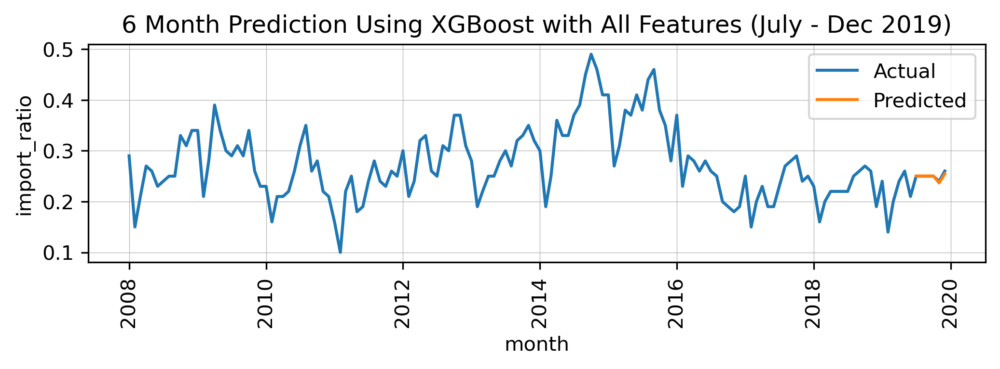

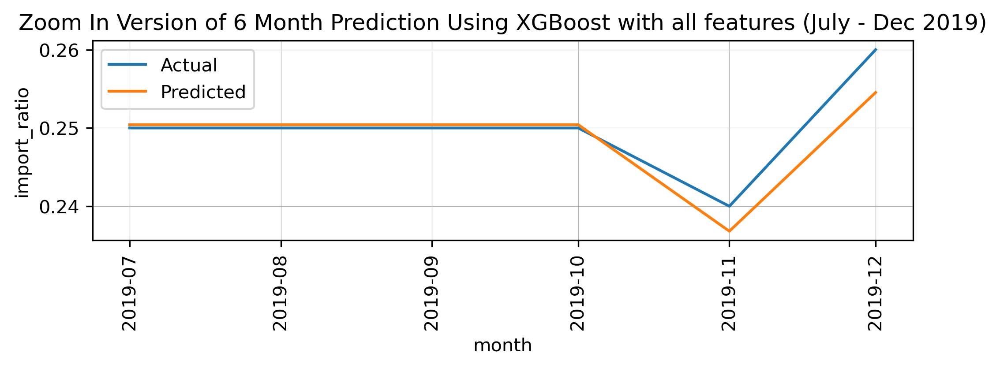

In [37]:
# HAS OUTLIER - all feature
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=combined_data1, x='month', y='import_ratio')
sns.lineplot(data=test_df1, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with All Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=test_df1, x='month', y='import_ratio')
sns.lineplot(data=test_df1, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction Using XGBoost with all features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)


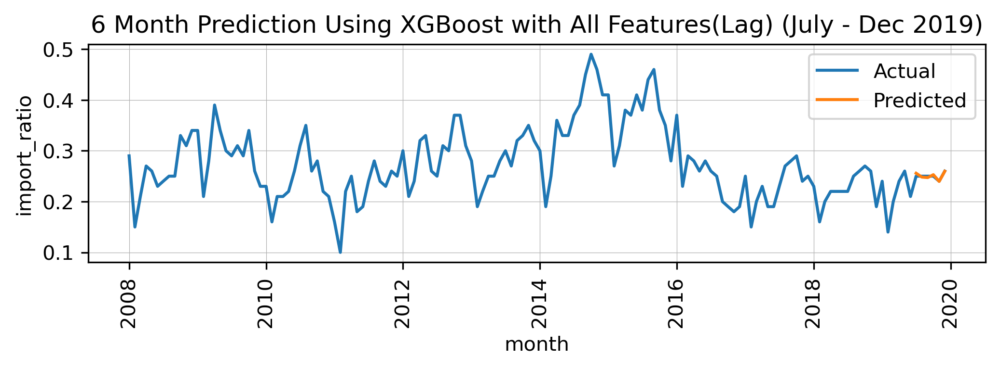

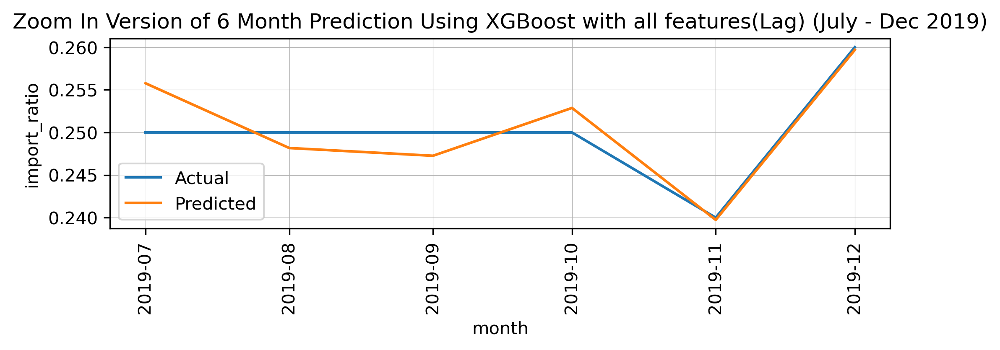

In [88]:
# HAS OUTLIER - all feature + LAG
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=combined_data1_lag, x='month', y='import_ratio')
sns.lineplot(data=test_df1_lag, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with All Features(Lag) (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=test_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=test_df1_lag, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction Using XGBoost with all features(Lag) (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)



In [45]:
sel_df1 = selected_df1
sel_test_df1 = selected_test_df1

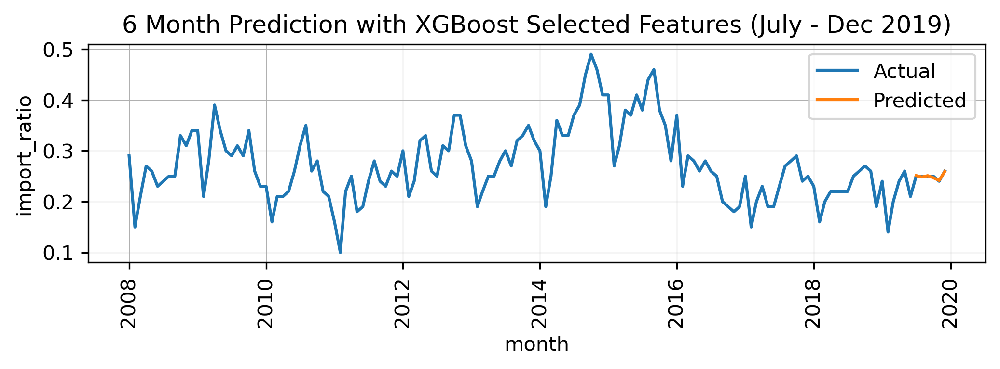

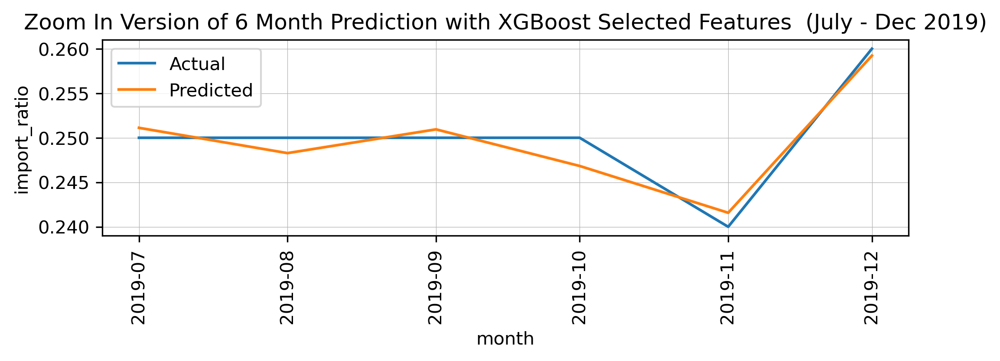

In [87]:
# HAS OUTLIER - selected features(8)
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=sel_df1, x='month', y='import_ratio')
sns.lineplot(data=sel_test_df1, x='month', y='predictions').set_title("6 Month Prediction with XGBoost Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=sel_test_df1, x='month', y='import_ratio')
sns.lineplot(data=sel_test_df1, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction with XGBoost Selected Features  (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

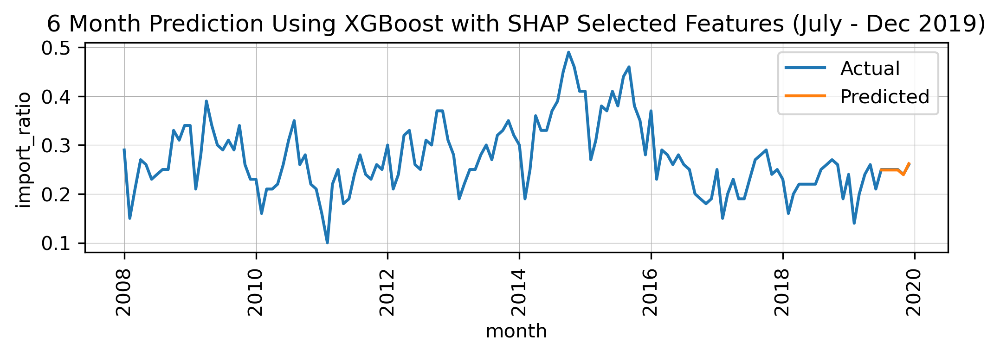

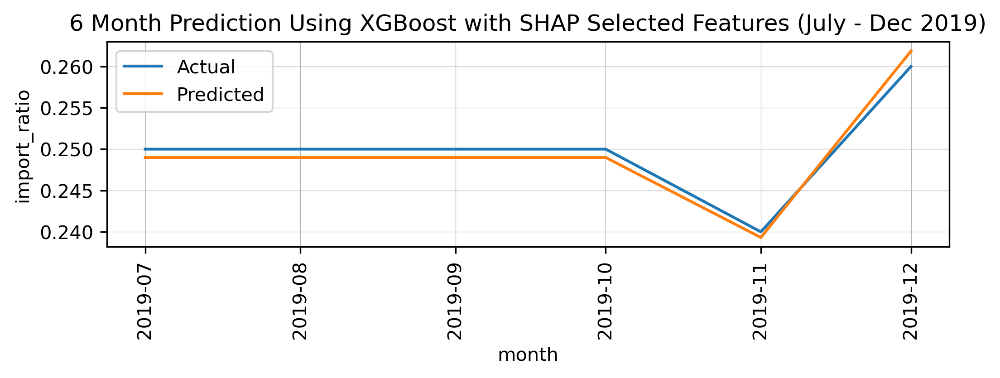

In [44]:
# HAS OUTLIER - shap selected features(17)
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=selected_df1, x='month', y='import_ratio')
sns.lineplot(data=selected_test_df1, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with SHAP Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=selected_test_df1, x='month', y='import_ratio')
sns.lineplot(data=selected_test_df1, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with SHAP Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

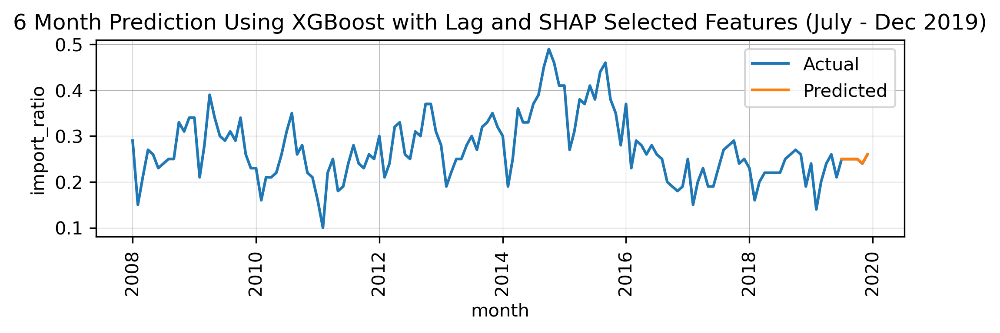

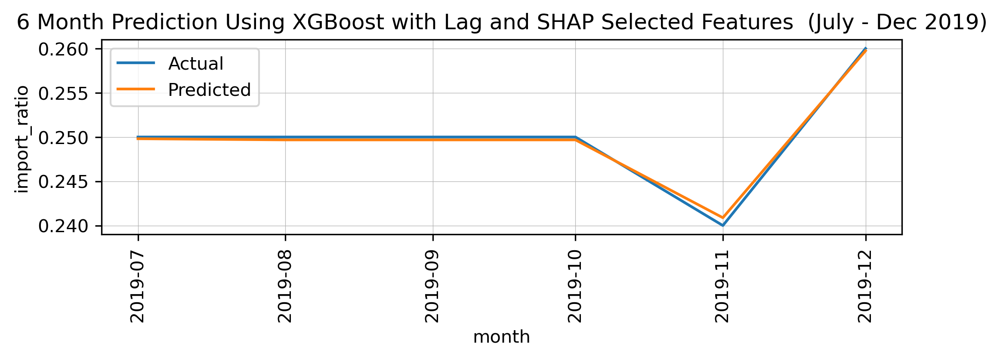

In [45]:
# HAS OUTLIER & 4 Lag feature + shap selected features(17)
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_lag1, x='month', y='import_ratio')
sns.lineplot(data=best_test_df1_lag, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with Lag and SHAP Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_test_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=best_test_df1_lag, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with Lag and SHAP Selected Features  (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

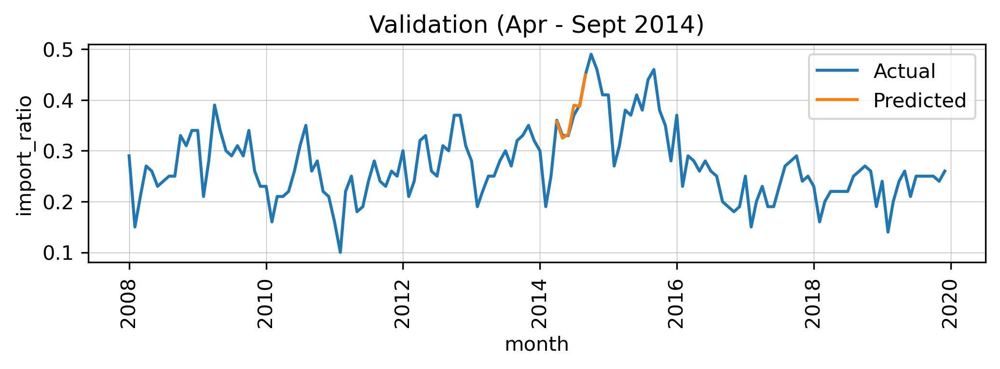

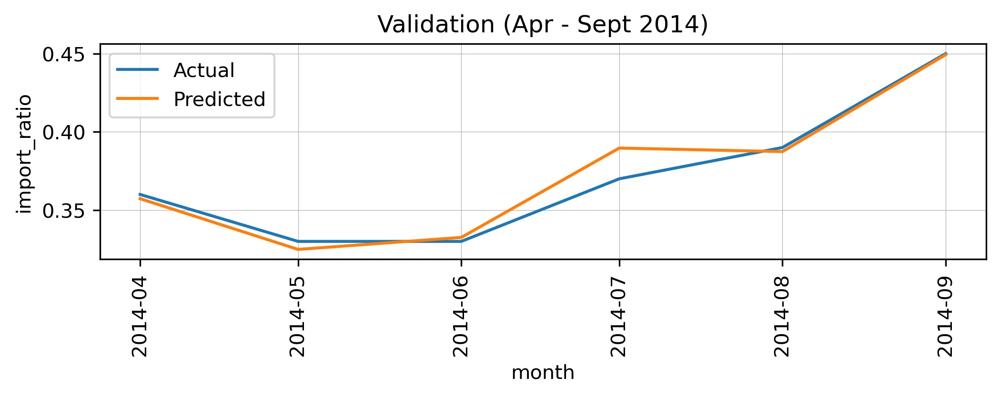

In [26]:
# HAS OUTLIER & Lag feature + shap selected features(17) & 2014 validation
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_lag1, x='month', y='import_ratio')
sns.lineplot(data=val_df1_lag, x='month', y='predictions').set_title("Validation (Apr - Sept 2014)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=val_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=val_df1_lag, x='month', y='predictions').set_title("Validation (Apr - Sept 2014)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

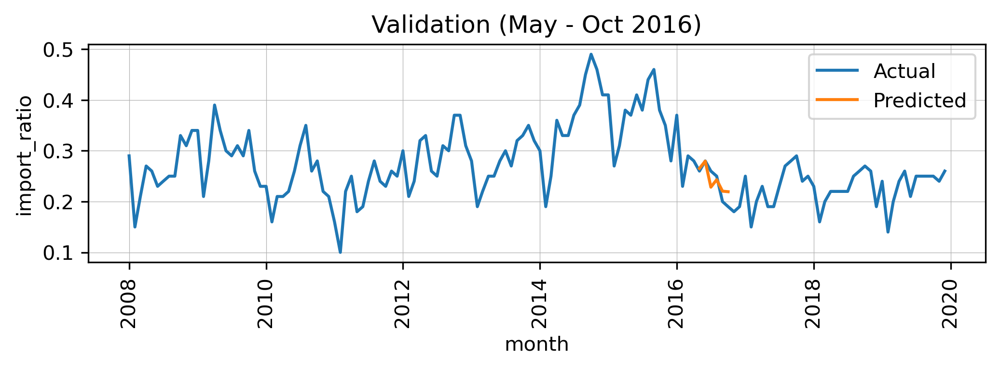

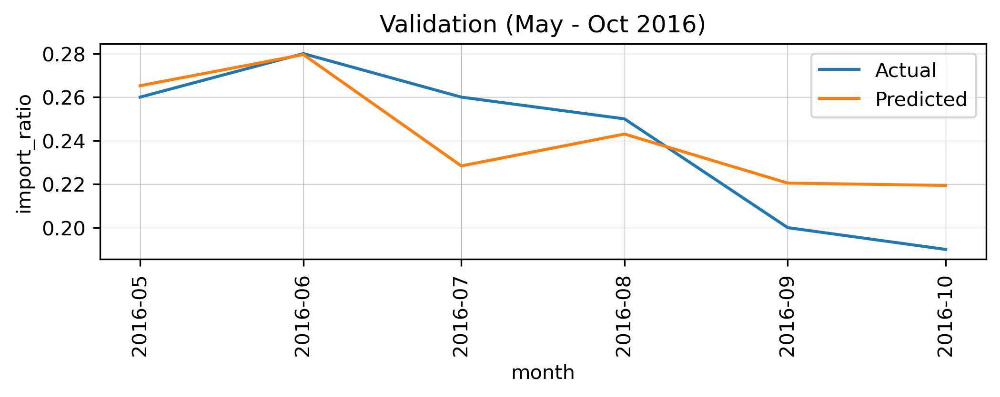

In [29]:
# HAS OUTLIER & Lag feature + shap selected features(17) & 2016 validation
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_lag1, x='month', y='import_ratio')
sns.lineplot(data=val_df1_lag, x='month', y='predictions').set_title("Validation (May - Oct 2016)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=val_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=val_df1_lag, x='month', y='predictions').set_title("Validation (May - Oct 2016)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

In [42]:
val_df1_lag['predictions']

96     0.369631
97     0.229969
98     0.290307
99     0.279753
100    0.260473
101    0.279996
Name: predictions, dtype: float32

In [45]:
best_lag1['import_ratio'][96:102]

96     0.37
97     0.23
98     0.29
99     0.28
100    0.26
101    0.28
Name: import_ratio, dtype: float64

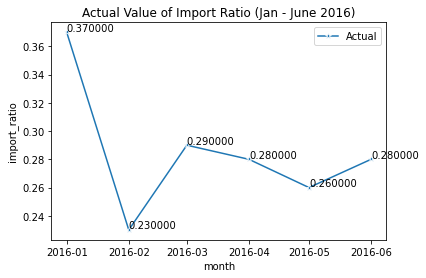

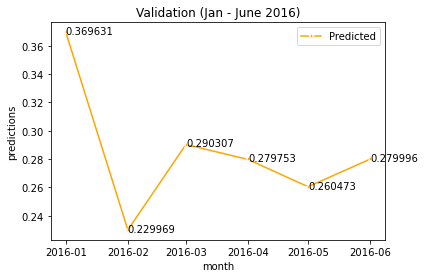

In [32]:
%matplotlib inline
from matplotlib.ticker import FormatStrFormatter

# HAS OUTLIER & Lag feature + shap selected features(17) & 2016 validation
plt.show()

#plt.rcParams.update({'figure.figsize': (5, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
a = sns.lineplot(data=val_df1_lag, x='month',
                 y='import_ratio',marker='*').set_title("Actual Value of Import Ratio (Jan - June 2016)")

#ax.set_xlabel('Month', fontsize=7)
#ax.set_ylabel('Import Ratio', fontsize=7)

# label points on the plot
for x, y in zip(val_df1_lag['month'], val_df1_lag['import_ratio']):
     plt.text(x = x, 
             y = y+0.001, 
             s = '{:.6f}'.format(y), fontsize=10)
        
ax.legend(['Actual']) 


#plt.rcParams.update({'figure.figsize': (5, 2), 'figure.dpi':300})
fig, ax = plt.subplots()

b = sns.lineplot(data=val_df1_lag, x='month', y='predictions', 
                 marker='*', color = 'orange').set_title("Validation (Jan - June 2016)")


# label points on the plot
for x, y in zip(val_df1_lag['month'], val_df1_lag['predictions']):
    plt.text(x = x, 
          y = y-0.0015, 
          s = '{:.6f}'.format(y), fontsize=10)

ax.legend(['Predicted'])


## Model Output Explaination Using Shap

Because the Tree SHAP algorithm is implemented in XGBoost we can compute exact SHAP values quickly over thousands of samples. The SHAP values for a single prediction (including the expected output in the last column) sum to the model's output for that prediction.

The below explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue. Another way to visualize the same explanation is to use a force plot.

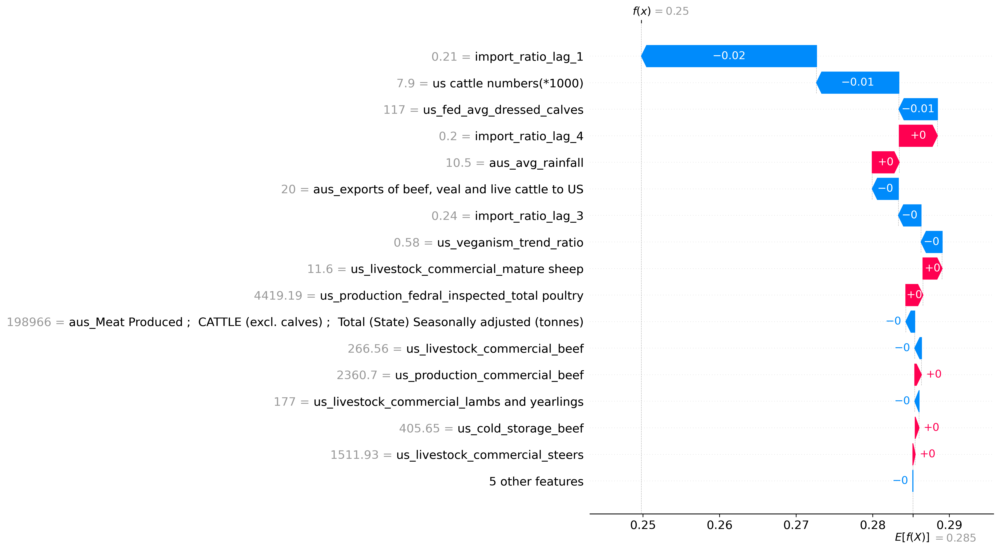

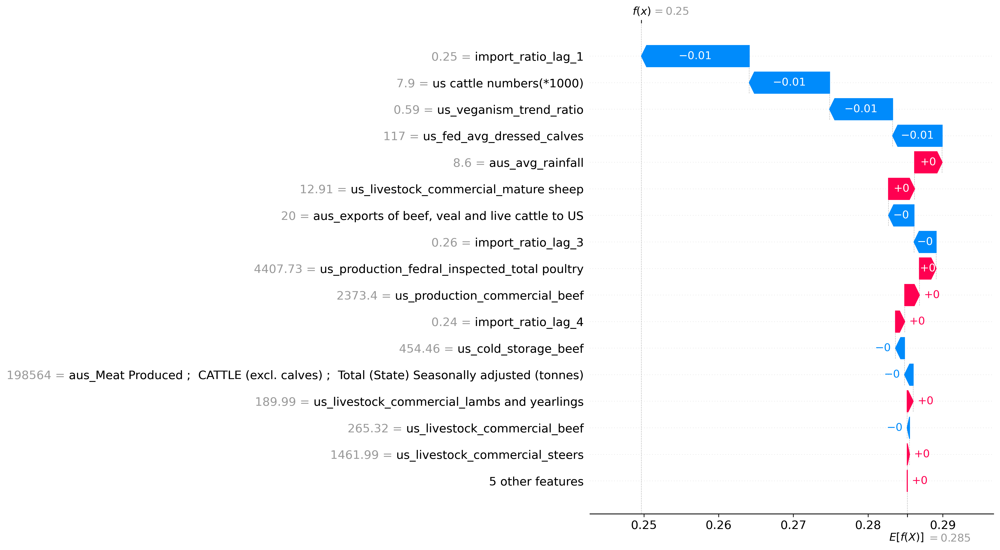

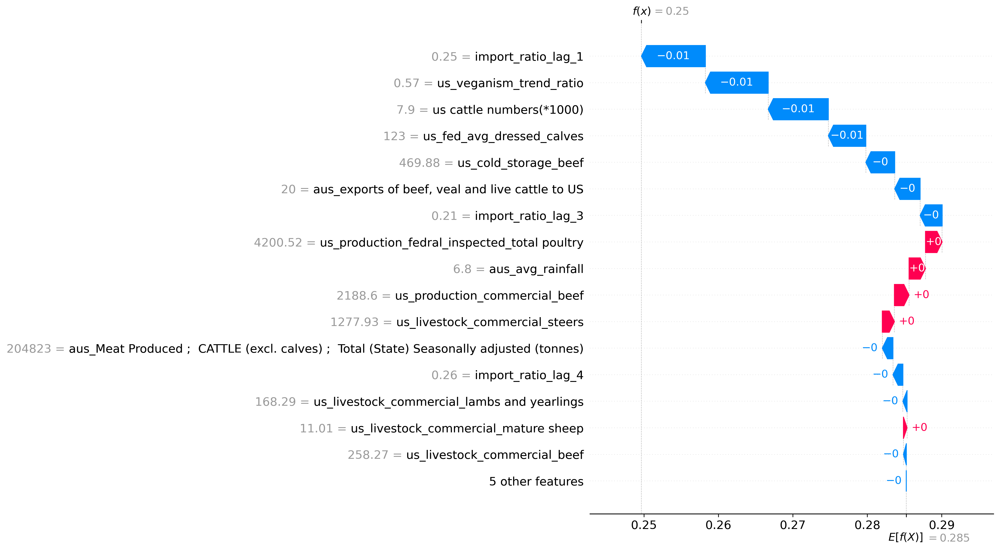

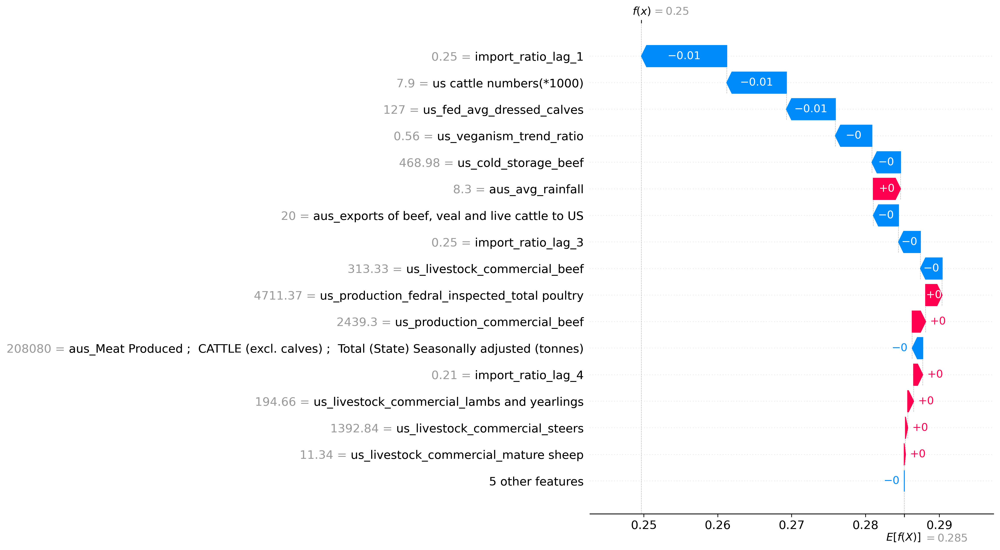

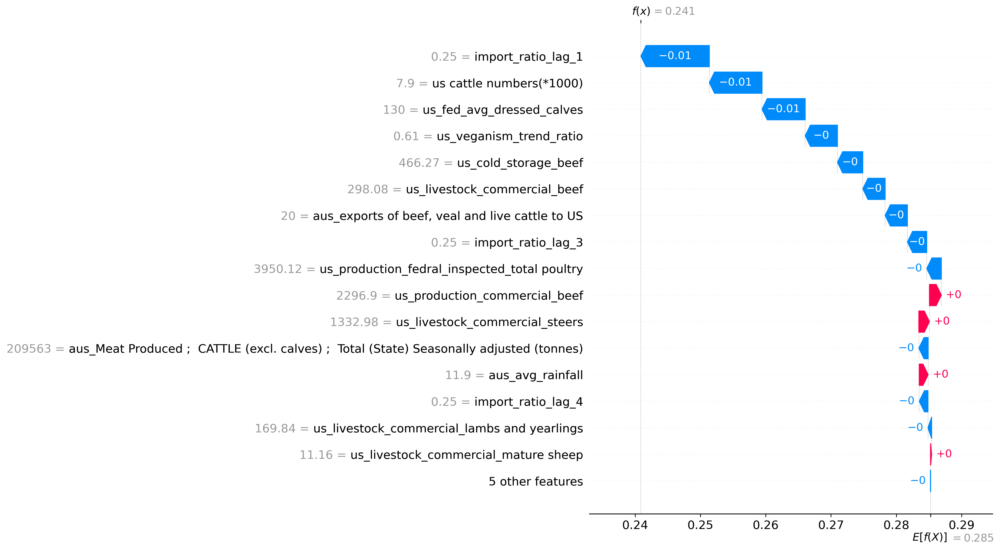

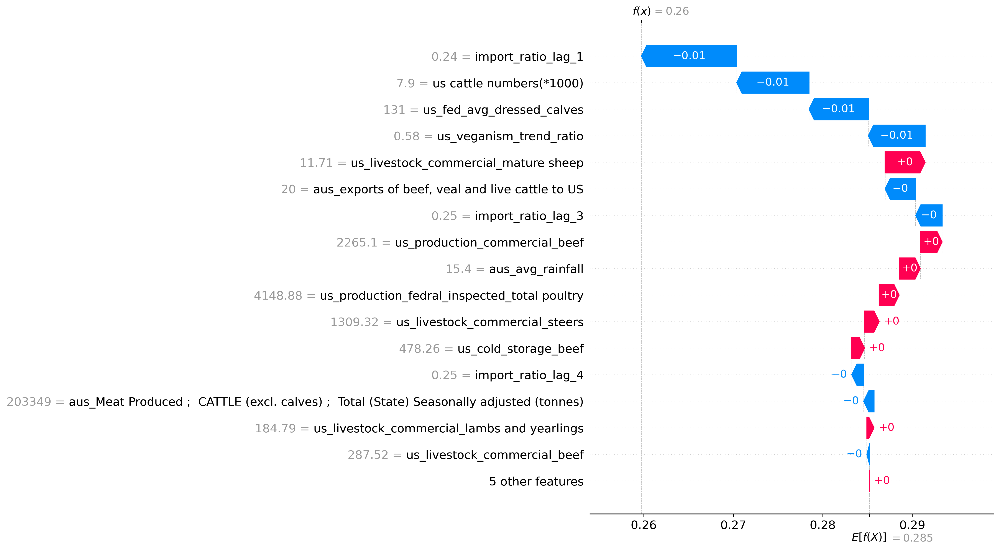

In [60]:
# compute the SHAP values for every prediction in the validation dataset
explainer_has_outlier = shap.TreeExplainer(best_model)
shap_values_has_outlier = explainer_has_outlier(best_X_test_lag)
#shap_values = explainer.shap_values(X_importance)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values_has_outlier[0], max_display=17, show=True)
shap.plots.waterfall(shap_values_has_outlier[1], max_display=17, show=True)
shap.plots.waterfall(shap_values_has_outlier[2], max_display=17, show=True)
shap.plots.waterfall(shap_values_has_outlier[3], max_display=17, show=True)
shap.plots.waterfall(shap_values_has_outlier[4], max_display=17, show=True)
shap.plots.waterfall(shap_values_has_outlier[5], max_display=17, show=True)


In [42]:
#shap.force_plot(explainer_has_outlier.expected_value, shap_values_has_outlier.values[1,:], X_test.iloc[1,:])

In [48]:
# visualize a single(first) prediction's explanation with a force plot
shap.plots.force(shap_values_has_outlier[0])

In [49]:
shap.plots.force(shap_values_has_outlier[1])

In [50]:
shap.plots.force(shap_values_has_outlier[2])

In [58]:
shap.plots.force(shap_values_has_outlier[3])

In [52]:
shap.plots.force(shap_values_has_outlier[4])

In [53]:
shap.plots.force(shap_values_has_outlier[5])

SHAP values sum to the difference between the expected output of the model and the current output for the current player. Note that for the Tree SHAP implmementation the margin output of the model is explained, not the transformed output (such as a probability for logistic regression). This means that the units of the SHAP values for this model are log odds ratios. Large positive values mean the import ratio is more likely to increase, while large negative values mean the import ratio is more likely to decrease.

## visualize all the test set predictions
If we take many force plot explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset (in the notebook this plot is interactive):



In [49]:
# visualize all the test set predictions
shap.plots.force(explainer_has_outlier.expected_value, shap_values_has_outlier.values, best_X_test_lag)
#pred_plot.figure.savefig("all_test_pred.pdf", format='pdf', dpi=1000, bbox_inches='tight')
#shap.force_plot(explainer.expected_value, shap_values[0, :], X_sample.iloc[0, :], matplotlib=True, show=False)
#plt.savefig('force_plot.png')

## Summarize the impact of all features over the entire dataset

A SHAP value for a feature of a specific prediction represents how much the model prediction changes when we observe that feature. In the summary plot below we plot all the SHAP values for a single feature on a row, where the x-axis is the SHAP value. By doing this for all features, we see which features drive the model's prediction a lot (such as us_total_red meat), and which only effect the prediction a little. Note that when points don't fit together on the line they pile up vertically to show density. Each dot is also colored by the value of that feature from high to low.

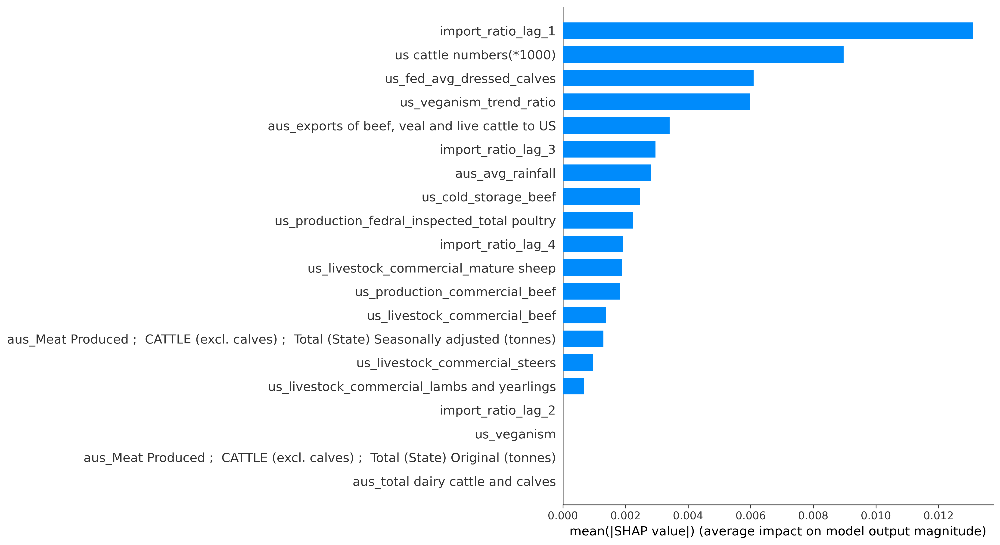

In [54]:
shap.summary_plot(shap_values_has_outlier, best_X_test_lag,plot_type="bar", show=False)
plt.savefig("6M_shap_summary_plot.pdf", format='pdf', dpi=1000, bbox_inches='tight')

In [51]:
def global_shap_importance(model, X):
    """ Return a dataframe containing the features sorted by Shap importance
    Parameters
    ----------
    model : The tree-based model 
    X : pd.Dataframe
         training set/test set/the whole dataset ... (without the label)
    Returns
    -------
    pd.Dataframe
        A dataframe containing the features sorted by Shap importance
    """
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    cohorts = {"": shap_values}
    cohort_labels = list(cohorts.keys())
    cohort_exps = list(cohorts.values())
    for i in range(len(cohort_exps)):
        if len(cohort_exps[i].shape) == 2:
            cohort_exps[i] = cohort_exps[i].abs.mean(0)
    features = cohort_exps[0].data
    feature_names = cohort_exps[0].feature_names
    values = np.array([cohort_exps[i].values for i in range(len(cohort_exps))])
    feature_importance = pd.DataFrame(
        list(zip(feature_names, sum(values))), columns=['features', 'importance'])
    feature_importance.sort_values(
        by=['importance'], ascending=False, inplace=True)
    return feature_importance

out1 = global_shap_importance(model_all_yes, X_test)
out1.to_csv("old_6m_shap_rank.csv")

## Decision plot

- The x-axis represents the model's output. In this case, the units are log odds.

- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.

- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. 

- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.

- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.

- At the bottom of the plot, the observations converge at explainer.expected_value.


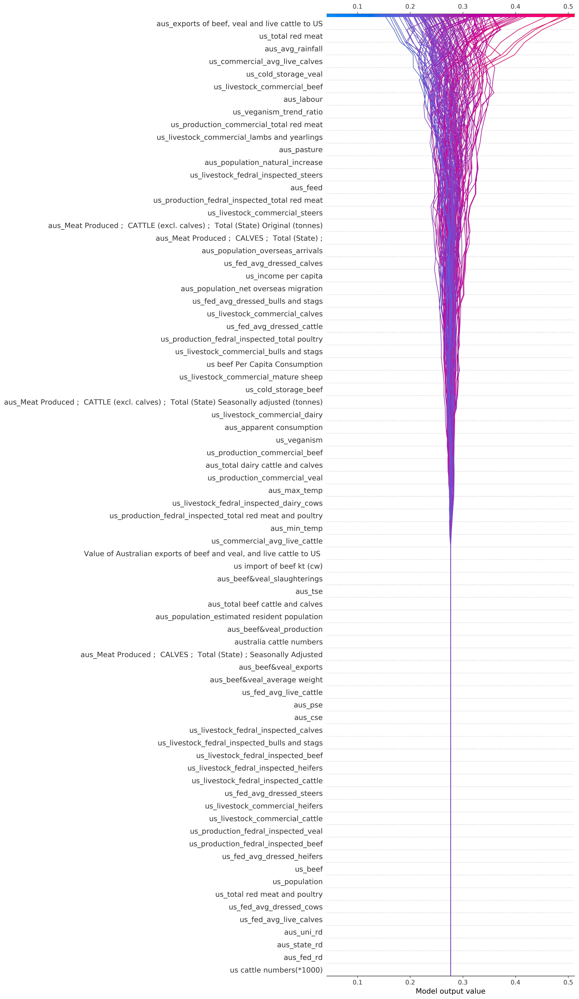

In [185]:
shap.decision_plot(explainer_has_outlier.expected_value, explainer_has_outlier.shap_values(X_train), X_train,
                   feature_display_range=slice(None, None, -1))